# Thresholding for lane detection

In [2]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In order to detect the lane lines to begin with, we're going to attempt to segment the lane lines from the RGB images. For this, we're going to take two assumptions:

- Lane lines are either `yellow`, or
- Line lines are `white`.

For testing, a set of "friendly" images and a set of images taken from a challenging video are taken.
In the friendly set, the lane lines are never obstructed, although they might be subject do
lighting changes (shadows, in essence) and on changing background (i.e. brither and darker tarmac).
The "challenging" images are subject to obstructed lane lines due to other drivers crossing them, 
extreme curvature of the road, sunlight flares leading to low-contrast images and extreme changes in
lighting conditions with total loss of contrast.

In [7]:
friendly_paths = glob.glob(os.path.join('..', 'test_images', 'test*.jpg'))
hard_paths = glob.glob(os.path.join('..', 'test_images', 'challenge*.jpg'))
len(friendly_paths), len(hard_paths)

(6, 9)

Here's a gallery of the friendly images:

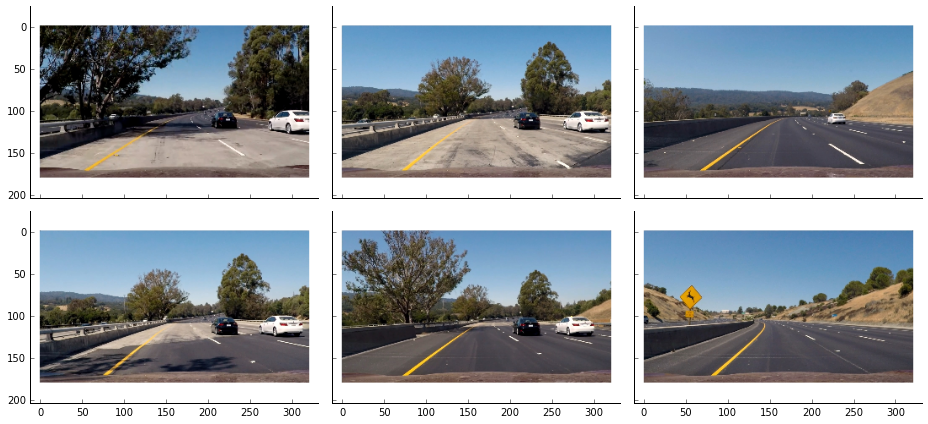

In [23]:
def gallery(paths):
    ncols = 3
    nrows = len(paths) // ncols
    f, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(13, nrows*3), sharex=True, sharey=True)
    for i, ax in enumerate(np.ravel(axs)):
        img = cv2.imread(paths[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (0, 0), fx=0.25, fy=0.25)
        ax.imshow(img)
    plt.tight_layout()
    sns.despine()
    
gallery(friendly_paths)

And these are a sample of hard ones:

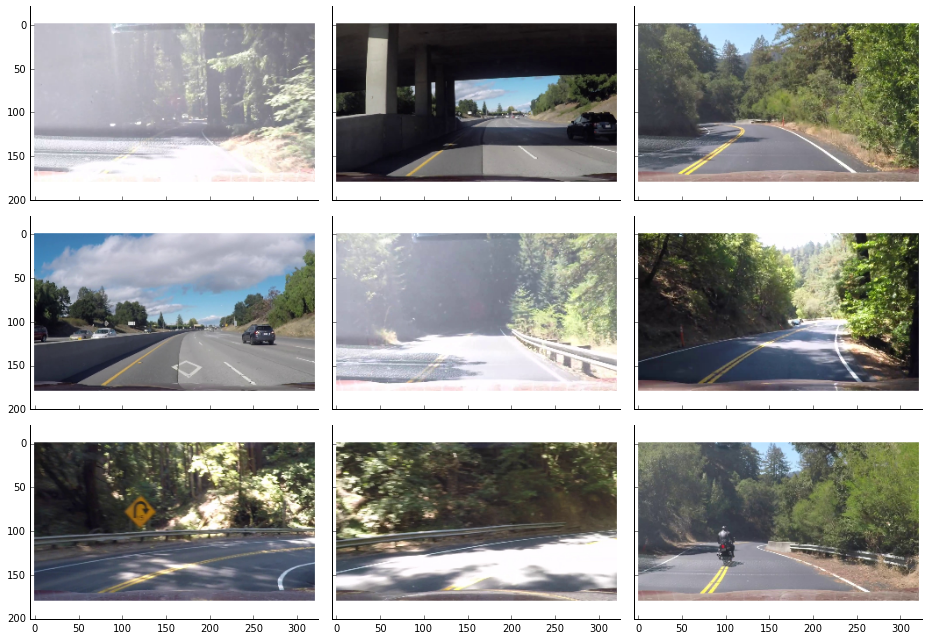

In [24]:
gallery(hard_paths)

While the friendly paths can be used for quick prototyping, obtaining good results on the hard images is the ultimate goal.

## Color-based segmentation

The first approach we're going to take is to attempt to segment the lane lines by their color or brightness,
while simultaneously trying to keep the amount of false positives small.

In order to select a helpful color space, we define a helper function that displays all 
channels of some color spaces available in OpenCV.

In [59]:
def channel_gallery(bgr: np.ndarray) -> None:
    bgr = cv2.resize(bgr, (0, 0), fx=0.25, fy=0.25)
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    hls = cv2.cvtColor(bgr, cv2.COLOR_BGR2HLS)
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2Lab)
    luv = cv2.cvtColor(bgr, cv2.COLOR_BGR2Luv)
    yuv = cv2.cvtColor(bgr, cv2.COLOR_BGR2YUV)
    
    f, axs = plt.subplots(nrows=6, ncols=3, figsize=(13, 5*3), sharex=True, sharey=True)
    cmap = 'gray'

    axs[0, 0].imshow(bgr[..., 2], cmap=cmap)
    axs[0, 1].imshow(bgr[..., 1], cmap=cmap)
    axs[0, 2].imshow(bgr[..., 0], cmap=cmap)
    axs[0, 0].set_title('RGB red')
    axs[0, 1].set_title('RGB green')
    axs[0, 2].set_title('RGB blue')
    
    axs[1, 0].imshow(hsv[..., 0], cmap=cmap)
    axs[1, 1].imshow(hsv[..., 1], cmap=cmap)
    axs[1, 2].imshow(hsv[..., 2], cmap=cmap)
    axs[1, 0].set_title('HSV hue')
    axs[1, 1].set_title('HSV saturation')
    axs[1, 2].set_title('HSV value')
    
    axs[2, 0].imshow(hls[..., 0], cmap=cmap)
    axs[2, 1].imshow(hls[..., 1], cmap=cmap)
    axs[2, 2].imshow(hls[..., 2], cmap=cmap)
    axs[2, 0].set_title('HLS hue')
    axs[2, 1].set_title('HLS lightness')
    axs[2, 2].set_title('HLS saturation')
    
    axs[3, 0].imshow(lab[..., 0], cmap=cmap)
    axs[3, 1].imshow(lab[..., 1], cmap=cmap)
    axs[3, 2].imshow(lab[..., 2], cmap=cmap)
    axs[3, 0].set_title('CIE L*a*b* luminance (L*)')
    axs[3, 1].set_title('CIE L*a*b* green-red (a*)')
    axs[3, 2].set_title('CIE L*a*b* blue-yellow (b*)')
    
    axs[4, 0].imshow(luv[..., 0], cmap=cmap)
    axs[4, 1].imshow(luv[..., 1], cmap=cmap)
    axs[4, 2].imshow(luv[..., 2], cmap=cmap)
    axs[4, 0].set_title('CIE L*u*v* luminance (L*)')
    axs[4, 1].set_title('CIE L*u*v* green-red (u*)')
    axs[4, 2].set_title('CIE L*u*v* blue-yellow (v*)')
    
    axs[5, 0].imshow(yuv[..., 0], cmap=cmap)
    axs[5, 1].imshow(yuv[..., 1], cmap=cmap)
    axs[5, 2].imshow(yuv[..., 2], cmap=cmap)
    axs[5, 0].set_title('YUV luma')
    axs[5, 1].set_title('YUV chroma U')
    axs[5, 2].set_title('YUV chroma V')
    
    plt.tight_layout()
    sns.despine()

We starting with a "nice" image from the challenge image domain. In this image, both the yellow 
and white lines are unobstructed and only subject to lighting changes.

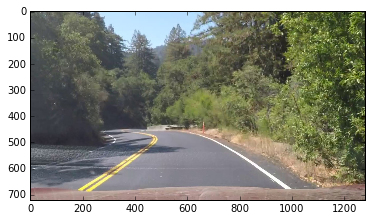

In [38]:
test_img_idx = 2
test_img = cv2.imread(hard_paths[test_img_idx])
plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB));

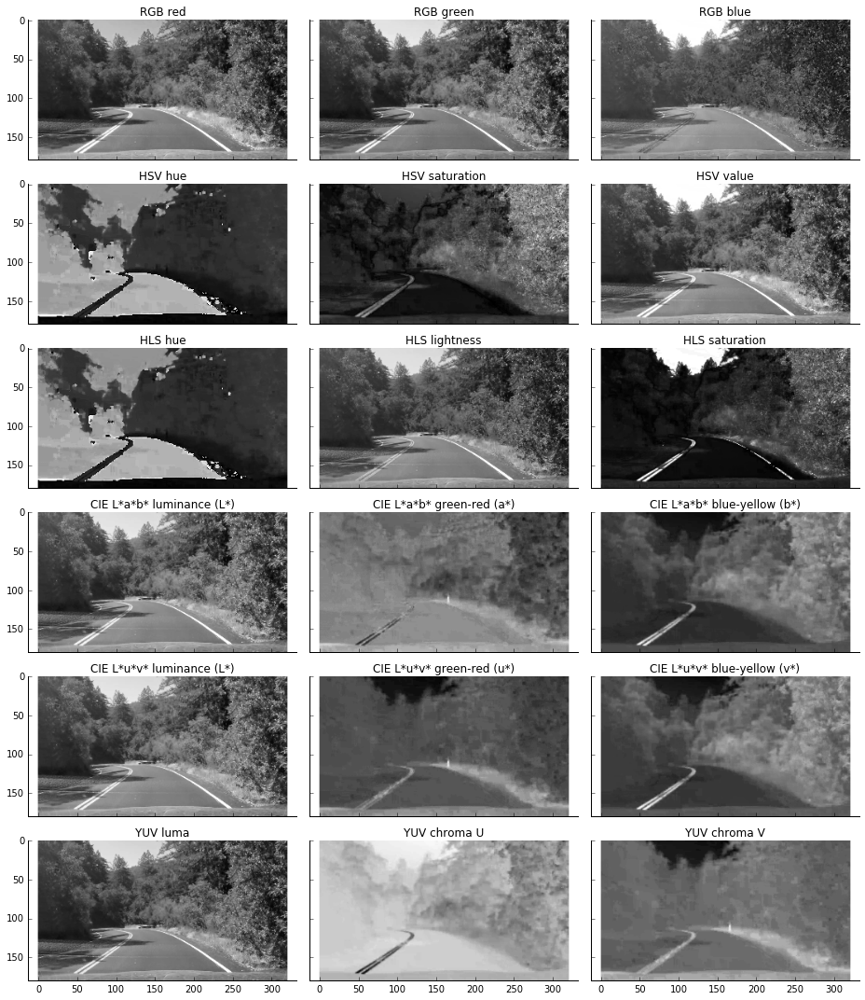

In [60]:
channel_gallery(test_img)

Here are some observations:

- The HLS `saturation` channel picks up both the white and yellow lane lines extremely well.
- The RGB `blue` channel suppresses the yellow line altogether due to blue being a complementary color of yellow. However, since blue is not a color that occurs very often in nature (see e.g. [There's Evidence Humans Didn't Actually See Blue Until Modern Times](https://www.sciencealert.com/humans-didn-t-see-the-colour-blue-until-modern-times-evidence-science) or [The science of blue flowers](https://www.mnn.com/your-home/organic-farming-gardening/stories/the-science-of-blue-flowers)), it might still be a valid choice for detecting the white line.
- All blue sensitive color channels such as L\*a\*b's `b*`, L\*u\*v's `v*` and YUV's `U` channel pick up the yellow line very well and could be used in addition to other channels.

One particularly interesting aspect of the HLS color space can be seen when we look at its color representation visually (image borrowed from [here](https://wisotop.de/hsv-und-hsl-farbmodell.php)):

![](images/hsv-hsl.png)

In contrast to HSV, we find that for hight lightness values, saturation doesn't change much. 
Since the yellow line is has a very high saturation to begin with and the white line is very bright, both
are picked up extremely well in this image.

Let's now have a look at an image with very low contrast.

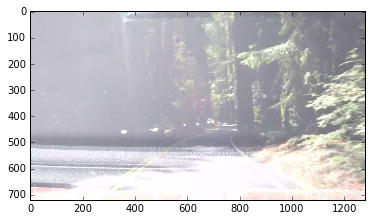

In [273]:
test_img_idx = 0
test_img = cv2.imread(hard_paths[test_img_idx])
plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB));

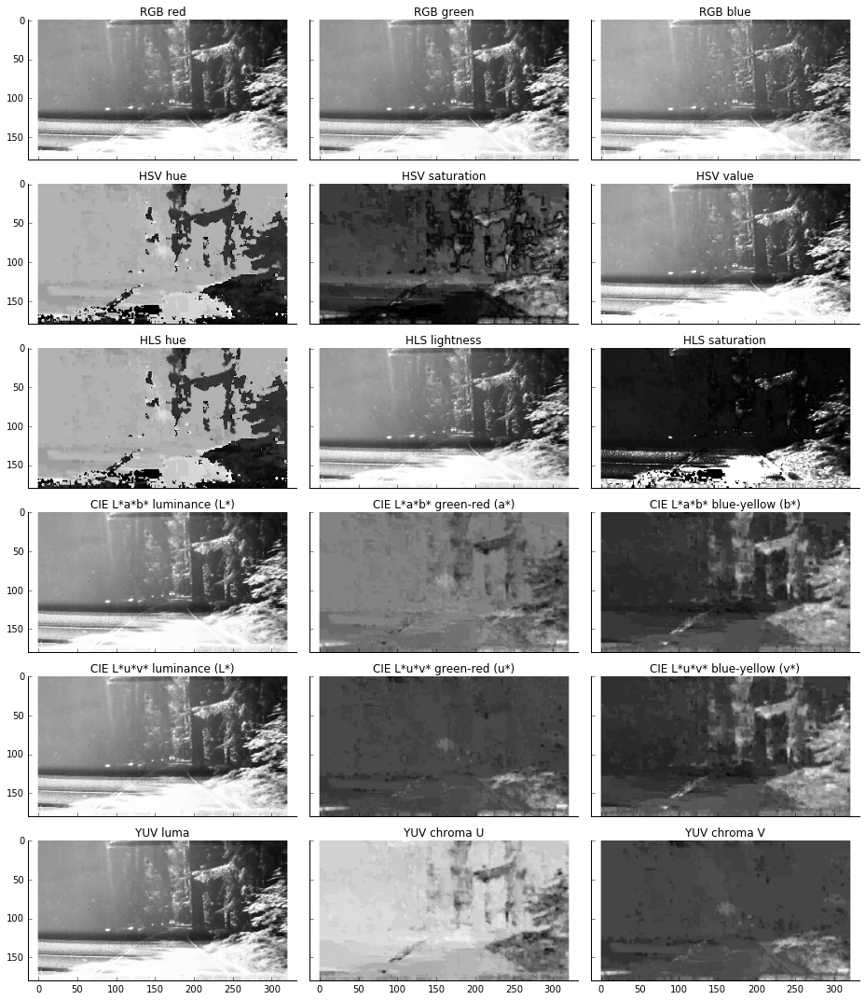

In [274]:
channel_gallery(test_img)

While the white line is harly recognizable in any of the images right now, L\*a\*b's `b*` and L\*u\*v's `v*` channels still pick up the yellow line (alongside some foliage).

However, we probably shouldn't be feeding this image into the system as is to begin with and  
it appears as if contrast normalization techniques could help.
When we look at the histogram of lightness values, we find that a big amount of pixels is in the middle
range of the lightness spectrum, resulting in a low overall contrast, followed by another big number of pixels that are (close to) pure white, indicating data might be lost due to clipping.

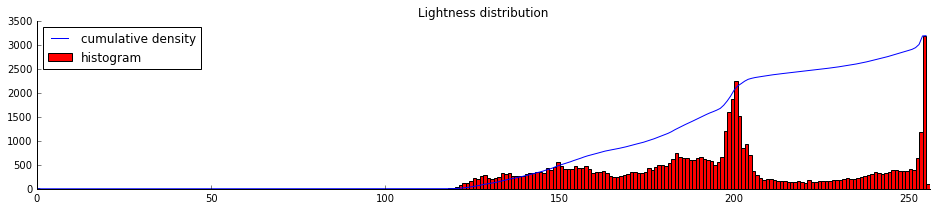

In [275]:
def lightness_histogram(img):
    test_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[..., 1]
    test_hls = cv2.resize(test_hls, (0, 0), fx=0.25, fy=0.25)

    hist, bins = np.histogram(test_hls.flatten(), 256, [0, 256])

    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    plt.figure(figsize=(16, 3))
    plt.plot(cdf_normalized, color = 'b')
    plt.hist(test_hls.flatten(), 256, [0, 256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cumulative density', 'histogram'), loc = 'upper left')
    plt.title('Lightness distribution')
    sns.despine()
    
lightness_histogram(test_img)

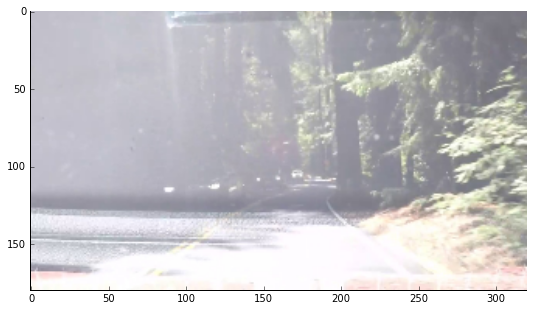

In [277]:
plt.figure(figsize=(10, 5))
plt.imshow(cv2.resize(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB), (0, 0), fx=0.25, fy=0.25));
sns.despine()

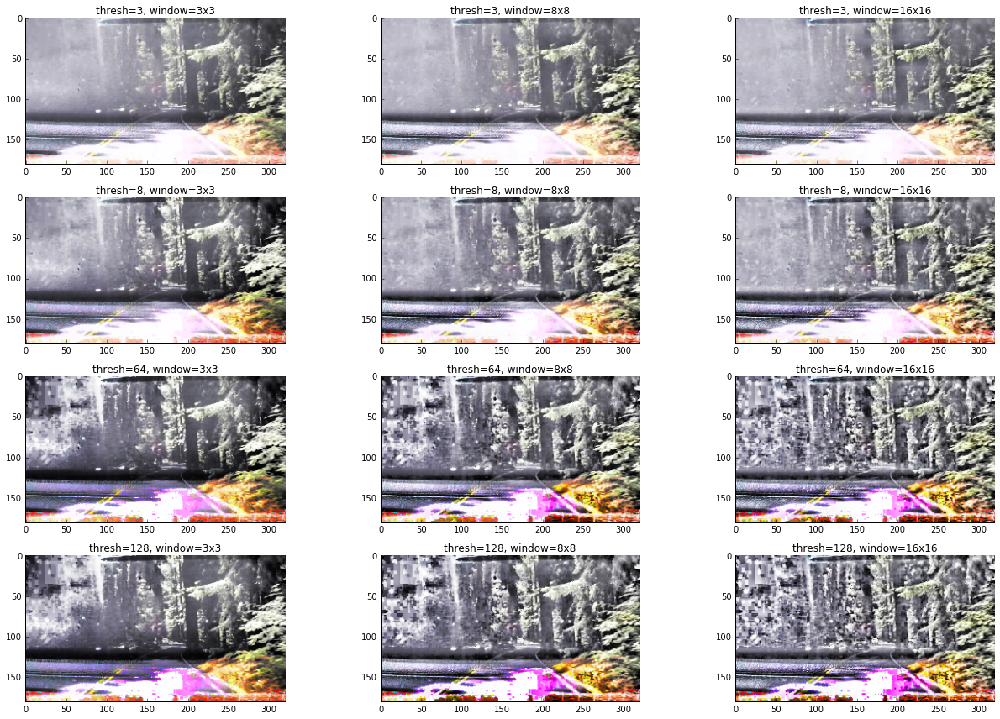

In [278]:
def clahe_filter(img, clip_limit, grid_size, resize: bool=False):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)   
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=grid_size)
    hls[..., 1] = clahe.apply(hls[..., 1])
    
    if resize:
        hls = cv2.resize(hls, (0, 0), fx=0.25, fy=0.25)
    return cv2.cvtColor(hls, cv2.COLOR_HLS2BGR)

f, axs = plt.subplots(nrows=4, ncols=3, figsize=(18, 12))
for i, w in enumerate([3, 8, 16]):
    for j, t in enumerate([3, 8, 64, 128]):
        img = cv2.cvtColor(clahe_filter(test_img, t, (w, w), True), cv2.COLOR_BGR2RGB)
        axs[j, i].imshow(img, cmap='gray')
        axs[j, i].set_title('thresh={0}, window={1}x{1}'.format(t, w))

plt.tight_layout()
sns.despine()

Let's pick one of the more promising results. We find that the lightness values are now much more stretched out.

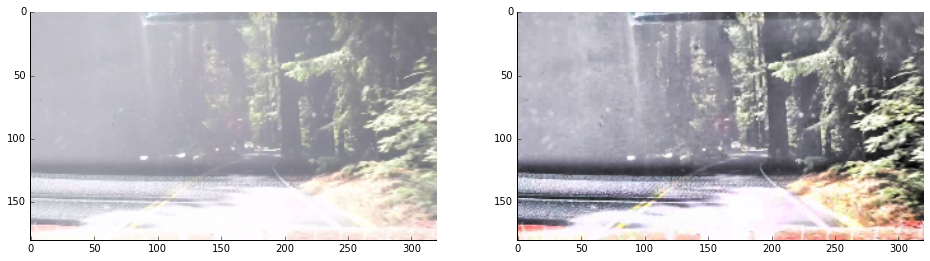

In [280]:
adjusted = clahe_filter(test_img, 3, (8, 8), False)

f, axs= plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
axs[0].imshow(cv2.resize(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB), (0, 0), fx=0.25, fy=0.25));
axs[1].imshow(cv2.resize(cv2.cvtColor(adjusted, cv2.COLOR_BGR2RGB), (0, 0), fx=0.25, fy=0.25));
sns.despine()

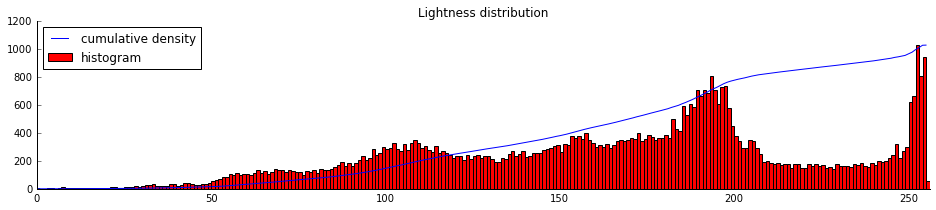

In [281]:
lightness_histogram(adjusted)

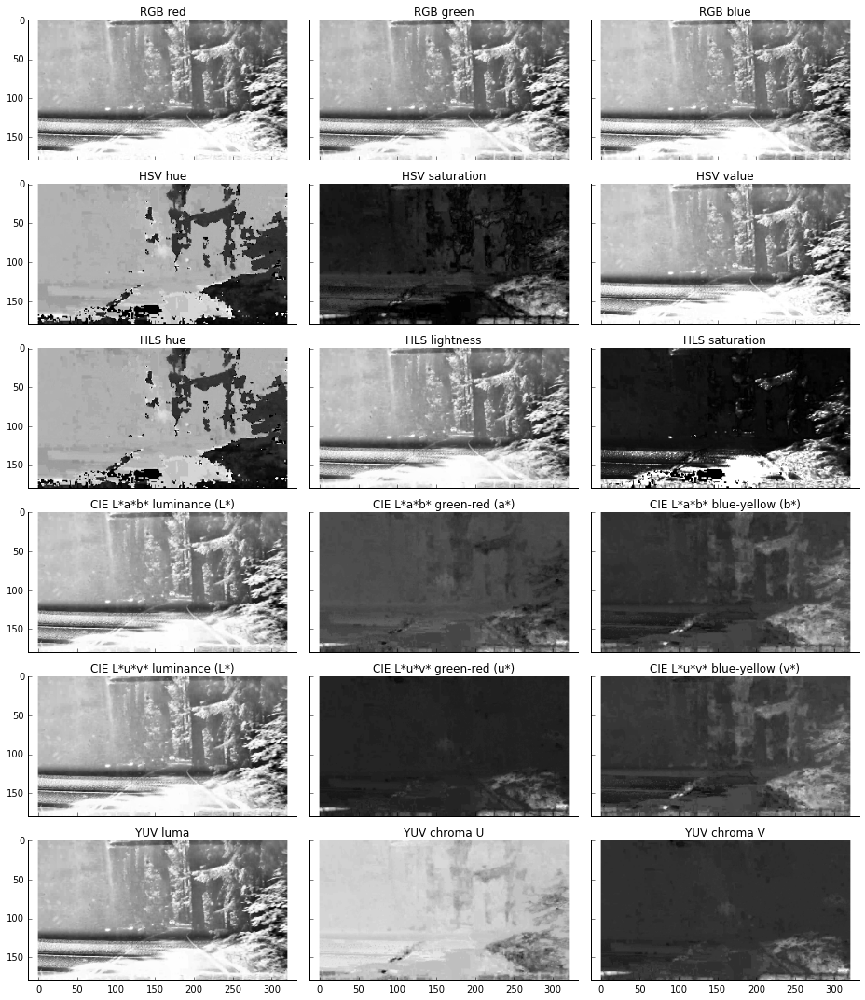

In [282]:
channel_gallery(adjusted)

However, 

- the HLS `saturation` channel appears to be blown out,
- yet the L\*a\*b\* `b*` and L\*u\*v\* `v*` channels do pick up the yellow line a bit.

Let's take one last example.

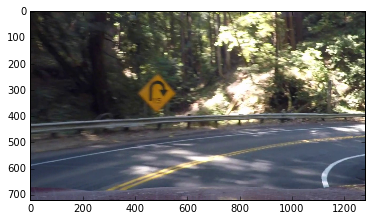

In [270]:
test_img_idx = 6
test_img = cv2.imread(hard_paths[test_img_idx])
plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB));

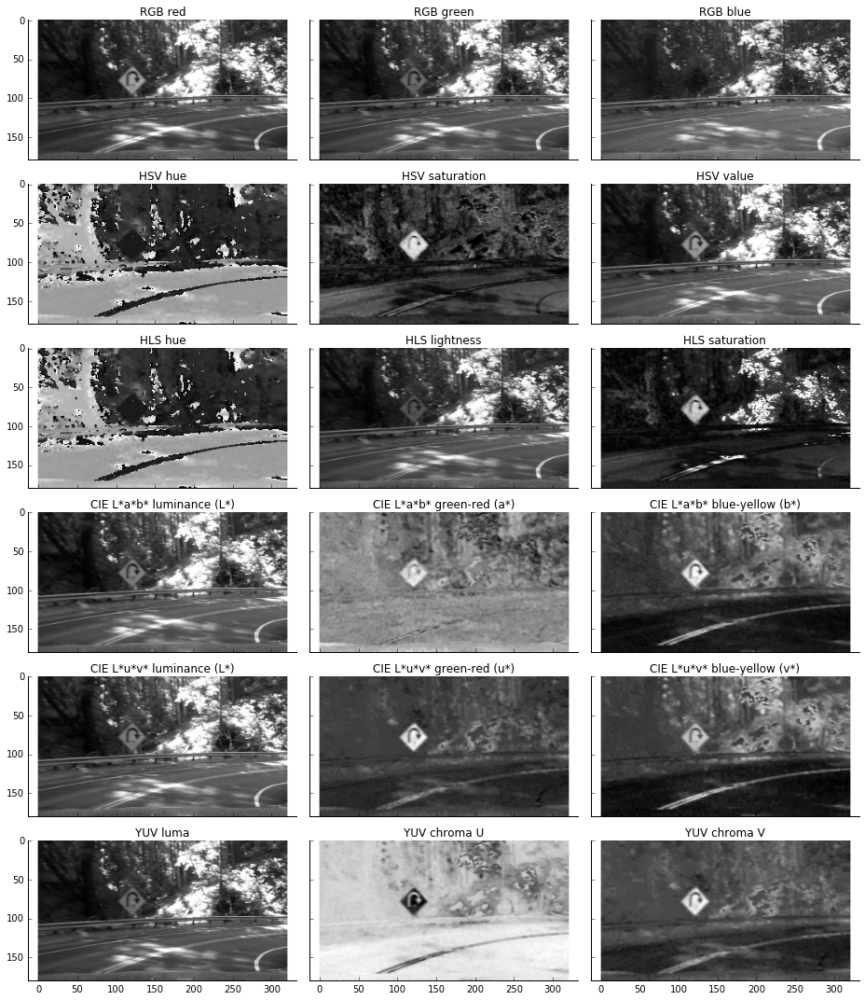

In [271]:
channel_gallery(test_img)

In this seemingly innocent image, we do find again that 

- The HLS `saturation` channel is only partially useful due to varying saturation in the yellow lane,
- The RGB `blue` channel picks up the white lane pretty well and
- The L\*a\*b `b*` and L\*u\*v `v*` channels pick up the yellow lane well.

### Picking color ranges

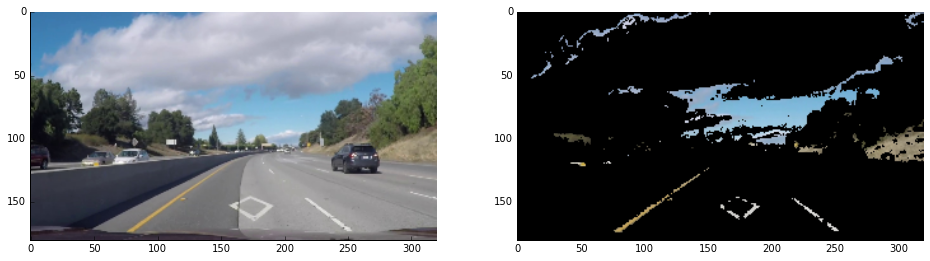

In [1371]:
test_img_idx = 3
test_img = cv2.imread(hard_paths[test_img_idx])
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
test_img = cv2.resize(test_img, (0, 0), fx=0.25, fy=0.25)

clahe = cv2.createCLAHE(clipLimit=25, tileGridSize=(23, 23))
hls[..., 1] = clahe.apply(hls[..., 1])

hls = cv2.cvtColor(test_img, cv2.COLOR_RGB2HLS)
mask0 = cv2.inRange(hls, (20, 32, 32), (30, 255, 255))
mask1 = cv2.inRange(hls, (20, 200, 0), (30, 255, 255))
mask2 = cv2.inRange(hls, (130, 220, 32), (190, 255, 64))
mask3 = cv2.inRange(hls, (100, 200, 64), (160, 255, 200))
mask4 = cv2.inRange(hls, (100, 164, 64), (160, 192, 200))
tarmac_bright = ~cv2.inRange(hls, (120, 128, 32), (150, 255, 250))

mask = mask0 | mask1 | mask2 | mask3 | mask4

def color_mask(img, mask):
    return img * (np.stack([mask]*3, axis=2) > 0)

f, axs= plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
axs[0].imshow(test_img)
axs[1].imshow(color_mask(test_img, mask & tarmac_bright), cmap='gray')
sns.despine();

## Channel combination

In [643]:
mask_paths = glob.glob(os.path.join('..', 'test_images', 'masks', '*.jpg'))
mask_src_paths = [os.path.join('..', 'test_images', os.path.basename(p)) for p in mask_paths]

train_images = [cv2.resize(cv2.imread(p, cv2.IMREAD_COLOR), (0, 0), fx=0.25, fy=0.25) 
                for p in mask_src_paths]
ground_truth = [cv2.resize(cv2.imread(p, cv2.IMREAD_GRAYSCALE), (0, 0), fx=0.25, fy=0.25) 
                for p in mask_paths]

In [819]:
def mix(bgr, x):
    yuv = cv2.cvtColor(bgr, cv2.COLOR_BGR2YUV)
    hls = cv2.cvtColor(bgr, cv2.COLOR_BGR2HLS)
    
    uv_clip, l_clip, s_clip = int(x[0]), int(x[1]), int(x[2])
    tile_size = int(x[3])
    
    uv_clahe = cv2.createCLAHE(clipLimit=uv_clip, tileGridSize=(tile_size, tile_size))
    l_clahe = cv2.createCLAHE(clipLimit=l_clip, tileGridSize=(tile_size, tile_size))
    s_clahe = cv2.createCLAHE(clipLimit=s_clip, tileGridSize=(tile_size, tile_size))
    yuv[..., 1] = uv_clahe.apply(yuv[..., 1])
    yuv[..., 2] = uv_clahe.apply(yuv[..., 2])
    hls[..., 1] = l_clahe.apply(hls[..., 1])
    hls[..., 2] = s_clahe.apply(hls[..., 2])
    
    yuv = yuv / 255.
    hls = hls / 255.
    
    u_mask = cv2.inRange(yuv[..., 1], x[4], x[5]) / 255
    v_mask = cv2.inRange(yuv[..., 2], x[6], x[7]) / 255
    l_mask = cv2.inRange(hls[..., 1], x[8], x[9]) / 255 
    s_mask = cv2.inRange(hls[..., 2], x[10], x[11]) / 255
    
    coeff_sum = np.abs(x[12]) + np.abs(x[13]) + np.abs(x[14]) + np.abs(x[15])
    if coeff_sum == 0:
        coeff_sum = 1
    mask = (x[12]*u_mask + x[13]*v_mask + x[14]*l_mask + x[15]*s_mask) / coeff_sum
    
    return (255 * np.clip(mask, 0, 1)).astype(np.uint8)
    
def target(x):
    error = 0
    for bgr, gt in zip(train_images, ground_truth):
        h, w = bgr.shape[:2]
        bgr = bgr[h//2:h, ...]
        gt = gt[h//2:h, ...]
        mask = mix(bgr, x)
        error += np.sum(np.abs(mask - gt))
    return error / len(train_images)

x0 = [3, 3, 3, 8,   # CLAHE parameters
      .2, .4,       # u range selection
      .6, .9,       # v range selection
      0.9,  1.,       # lightness range selection
      .9, 1.,       # saturation range selection
      .25, 0.01, .25, .25 # combination coefficients
      ]  

initial_error = target(x0)
initial_error

582582.27272727271

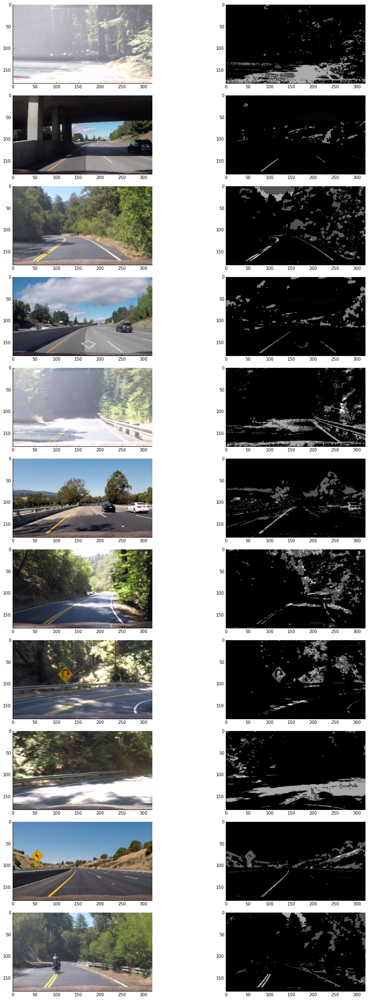

In [820]:
def display_mix(x):
    f, axs = plt.subplots(nrows=len(train_images), ncols=2, figsize=(16, 3*len(train_images)))

    for i in range(0, len(train_images)):
        axs[i, 0].imshow(cv2.cvtColor(train_images[i], cv2.COLOR_BGR2RGB))
        axs[i, 1].imshow(mix(train_images[i], x), cmap='gray')

    plt.tight_layout()
    sns.despine()
    
display_mix(x0)

In [815]:
from scipy.optimize import differential_evolution

bnds = ((1, 16), (1, 16), (1, 16), (3, 128),
        (0., 1.), (0., 1.), 
        (0., 1.), (0., 1.), 
        (0., 1.), (0., 1.), 
        (0., 1.), (0., 1.),
        (-1, 1.), (-1, 1.), (-1, 1.), (-1, 1.))

res = differential_evolution(target, bnds, maxiter=20, disp=True)

print(res)
print(res.fun/initial_error)

differential_evolution step 1: f(x)= 148082
differential_evolution step 2: f(x)= 148082
differential_evolution step 3: f(x)= 148082
differential_evolution step 4: f(x)= 148082
differential_evolution step 5: f(x)= 148082
differential_evolution step 6: f(x)= 148082
differential_evolution step 7: f(x)= 148082
differential_evolution step 8: f(x)= 142579
differential_evolution step 9: f(x)= 142579
differential_evolution step 10: f(x)= 142579
differential_evolution step 11: f(x)= 142579
differential_evolution step 12: f(x)= 142579
differential_evolution step 13: f(x)= 142579
differential_evolution step 14: f(x)= 142579
differential_evolution step 15: f(x)= 142579
differential_evolution step 16: f(x)= 142579
differential_evolution step 17: f(x)= 142579
differential_evolution step 18: f(x)= 142579
differential_evolution step 19: f(x)= 142579
differential_evolution step 20: f(x)= 142579
     fun: 142579.36363636365
 message: 'Maximum number of iterations has been exceeded.'
    nfev: 5057
     

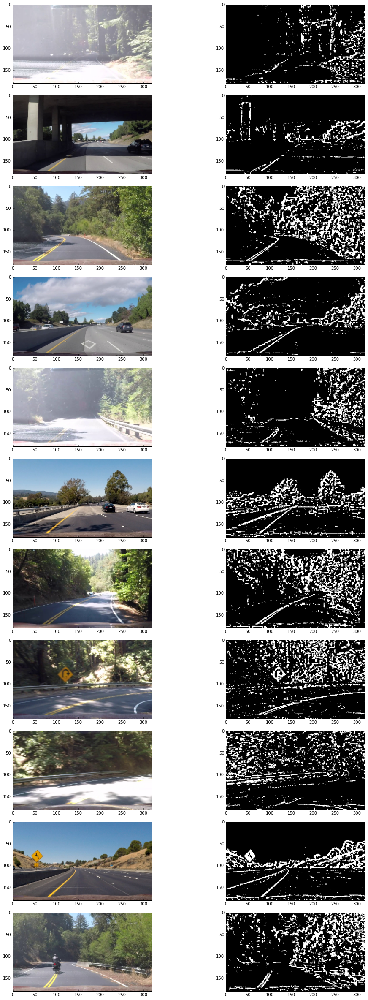

In [818]:
display_mix(res.x)

### Binarization

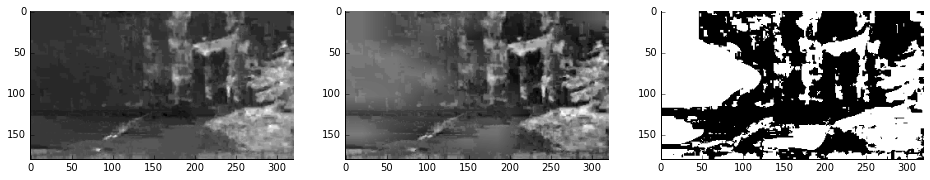

In [538]:
lab = cv2.cvtColor(test_img, cv2.COLOR_BGR2LAB)
lab = cv2.resize(lab, (0, 0), fx=0.25, fy=0.25)
    
clahe = cv2.createCLAHE(clipLimit=3, tileGridSize=(8, 8))
b = clahe.apply(lab[..., 2])

#thr = cv2.adaptiveThreshold(lab[..., 2], 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 33, -2)
_, thr = cv2.threshold(b, 128, 255, cv2.THRESH_BINARY)
 
f, axs= plt.subplots(nrows=1, ncols=3, figsize=(16, 6))
axs[0].imshow(lab[..., 2], cmap='gray');
axs[1].imshow(b, cmap='gray');
axs[2].imshow(thr, cmap='gray');
sns.despine()